In [40]:
import json
import os

In [65]:
json

<module 'json' from '/Users/nkees/opt/anaconda3/envs/pe-venv/lib/python3.7/json/__init__.py'>

In [58]:
!pip install matplotlib

In [20]:
# Convert results into the format as expected by ConvSumm (jsonl etc.)

file_name = "predict.pred.summary.epoch_18.json"
with open(file_name, 'r') as f:
    test_outputs = json.load(f)
    
print(len(test_outputs))

459


In [34]:
ids = list(test_outputs.keys())
summaries = list(test_outputs.values())
print(len(ids))
print(len(set(ids)))

459
459


In [35]:
ids

['Heartland_0',
 'Teen_Wolf_1',
 'Teen_Wolf_2',
 "Schitt's_Creek_3",
 'Doctor_Who_4',
 'The_Walking_Dead_5',
 'The_Walking_Dead_6',
 'The_Walking_Dead_7',
 'The_O.C._8',
 'Lucifer_9',
 'Lucifer_10',
 'Lucifer_11',
 'Lucifer_12',
 'Lucifer_13',
 'Lucifer_14',
 'Lucifer_15',
 'Lucifer_16',
 'Lucifer_17',
 'Lucifer_18',
 'Lucifer_19',
 'Lucifer_20',
 'Lucifer_21',
 'Lucifer_22',
 'Lucifer_23',
 'Lucifer_24',
 'Lucifer_25',
 'Lucifer_26',
 'Lucifer_27',
 "Dawson's_Creek_28",
 "Dawson's_Creek_29",
 "Dawson's_Creek_30",
 "Dawson's_Creek_31",
 "Dawson's_Creek_32",
 "Dawson's_Creek_33",
 "Dawson's_Creek_34",
 "Dawson's_Creek_35",
 "Dawson's_Creek_36",
 "Dawson's_Creek_37",
 "Dawson's_Creek_38",
 "Dawson's_Creek_39",
 "Dawson's_Creek_40",
 'The_4400_41',
 'Degrassi_Next_Generation_42',
 'Degrassi_Next_Generation_43',
 'Trailer_Park_Boys_44',
 'Trailer_Park_Boys_45',
 'Trailer_Park_Boys_46',
 'Trailer_Park_Boys_47',
 'House_48',
 'House_49',
 'House_50',
 'House_51',
 'House_52',
 'House_53',
 '

In [36]:
def adjust_data_model_for_submission(dataset):
    new_dataset = []
    for idx in range(len(dataset)):
        new_dataset.append({'instance_id': ids[idx],
                            'system_id': "inotum",
                            'summary': summaries[idx]
                           })
    return new_dataset

In [37]:
system_summaries = adjust_data_model_for_submission(test_outputs)

In [38]:
system_summaries

[{'instance_id': 'Heartland_0',
  'system_id': 'inotum',
  'summary': "When an old acquaintance of Amy's arrives in Heartland with her daughter Lyndy, she's torn between Amy's past as a racehorse owner and her loyalties to her family at Heartland. At the same time, Jack offers Lisa a chance to work with Wyatt during the summer."},
 {'instance_id': 'Teen_Wolf_1',
  'system_id': 'inotum',
  'summary': "Chris learns that the people who attacked him in Japan were demons looking for a dark spirit. They wanted to kill him to get to the kumicho boss. Scott discovers that Kira is a wendigo , and takes her out of the picture. Allison, Isaac and Kincaid learn that the demon who attacked them was a wendigo , a dark spirit linked to the Nogitsune , a dark shadow spirit that hides in foxes and thunderstorms. The Nogitsune is hunting for the dark spirit; the Oni are searching for it in Kira. Agent McCall saves Scott, and gives Kira a sedative so that she will sleep through the Nogitsune's attack. Sc

In [39]:
with open("system_summaries.jsonl", 'w') as out:
    for ddict in system_summaries:
        jout = json.dumps(ddict) + '\n'
        out.write(jout)

# Data analysis

## SummScreen, Forever Dreaming (Chen et al., 2022)
Path: `creative_summ_data/data/summ_screen_fd`

## SummScreen, TV Megasite (Chen et al., 2022)
Path: `creative_summ_data/data/summ_screen_tms`

In [2]:
def read_jsonl(path: str):
    with open(path, 'r') as json_file:
        json_list = list(json_file)

    data_list = []
    for json_str in json_list:
        result = json.loads(json_str)
        data_list.append(result)
    return data_list

In [8]:
path = "data/fd_test_instances.jsonl"
test_fd = read_jsonl(path)
len_test_fd = len(test_fd)
len_test_fd

459

In [9]:
print("Basic dataset statistics")
print("")

# Read SummScreen Forever Dreaming
path_fd = "data/summ_screen_fd"

# train
train_fd = read_jsonl(os.path.join(path_fd, "train.jsonl"))
len_train_fd = len(train_fd)
print(f"SummScreen Forever Dreaming TRAIN data contains -- {len_train_fd} -- examples.")

# valid

valid_fd = read_jsonl(os.path.join(path_fd, "validation.jsonl"))
len_valid_fd = len(valid_fd)
print(f"SummScreen Forever Dreaming VALIDATION data contains -- {len_valid_fd} -- examples.")

# test
test_fd = read_jsonl(os.path.join(path_fd, "test.jsonl"))
len_test_fd = len(test_fd)
print(f"SummScreen Forever Dreaming TEST data contains -- {len_test_fd} -- examples.")

total = len_train_fd + len_valid_fd + len_test_fd
print(f"Total: {total}")
print(f"Split: {len_train_fd/total}, {len_valid_fd/total}, {len_test_fd/total}")

print("")
print("--"*20)
print("")


# Read SummScreen TM Megasite
path_tms = "data/summscreen_tms"


# train
train_tms = read_jsonl(os.path.join(path_tms, "train.jsonl"))
len_train_tms = len(train_tms)
print(f"SummScreen TM Megasite TRAIN data contains -- {len_train_tms} -- examples.")

# valid

valid_tms = read_jsonl(os.path.join(path_tms, "dev.jsonl"))
len_valid_tms = len(valid_tms)
print(f"SummScreen TM Megasite VALIDATION data contains -- {len_valid_tms} -- examples.")

# test
test_tms = read_jsonl(os.path.join(path_tms, "test.jsonl"))
len_test_tms = len(test_tms)
print(f"SummScreen TM Megasiteg TEST data contains -- {len_test_tms} -- examples.")

total = len_train_tms + len_valid_tms + len_test_tms
print(f"Total: {total}")
print(f"Split: {len_train_tms/total}, {len_valid_tms/total}, {len_test_tms/total}")

Basic dataset statistics

SummScreen Forever Dreaming TRAIN data contains -- 3673 -- examples.
SummScreen Forever Dreaming VALIDATION data contains -- 338 -- examples.
SummScreen Forever Dreaming TEST data contains -- 337 -- examples.
Total: 4348
Split: 0.8447562097516099, 0.07773689052437903, 0.07750689972401104

----------------------------------------

SummScreen TM Megasite TRAIN data contains -- 18915 -- examples.
SummScreen TM Megasite VALIDATION data contains -- 1795 -- examples.
SummScreen TM Megasiteg TEST data contains -- 1793 -- examples.
Total: 22503
Split: 0.8405545927209706, 0.07976714215882327, 0.07967826512020619


In [66]:
test_df = read_jsonl("/Users/nkees/Projekte/Creative-Abs-Sum/creativesumm/architectures/ConvSumm/CODS/SUMMscreen/fd/test.jsonl")

In [44]:
def adjust_data_model(dataset):
    new_dataset = []
    for item in dataset:
        new_dataset.append({'id': item['id'],
                            'summary': item['output'],
                            'dialogue': item['input']
                           })
    return new_dataset


In [13]:
def adjust_data_model(dataset):
    new_dataset = []
    for item in dataset:
        new_dataset.append({'id': item['instance_id'],
                            #'summary': item['output'],
                            'dialogue': item['input']
                           })
    return new_dataset

In [14]:
test_df_new = adjust_data_model(test_fd)

In [18]:
to_json(test_df_new, "fd/new/test.json")

In [12]:
test_fd

[{'instance_id': 'Heartland_0',
  'input': 'Updated, Submitted & Corrected by: Adam :)\nAmy: (voice) Previously on Heartland\nLou: I thought once the new Maggie\'s was opened you\'d be home for good -\nLou: Georgie. you have to understand it\'s a franchise\nGeorgie: Yeah, It\'s a franchise so you\'ll open up another one and another.\nLisa: I am broke. I am having a very heard time keeping my business afloat.\nLou: I think you can be a really good fit for the management position.\nJen: I would love that.\nLou: Good.\n[Lou and Jen both chuckle]\nGeorgie: I decided not to go. I\'ll miss home and everyone here.\nWyatt: Anyone in particular?\n[NOW BACK TO THE SHOW]\n[The horse "Flyer" snorts and whinnies as his jockey rides him around the track. Lisa is watching the horse run the track.]\n[In Amy and Ty\'s barn loft home. Any is attending to Lyndy on the table. She is reading from a children book as she finishes dressing Lyndy.]\nAmy: (reading) "A moose and a goose together had juice, but n

In [27]:
train_fd_new = adjust_data_model(train_fd)
valid_fd_new = adjust_data_model(valid_fd)
test_fd_new = adjust_data_model(test_fd)

train_tms_new = adjust_data_model(train_tms)
valid_tms_new = adjust_data_model(valid_tms)
test_tms_new = adjust_data_model(test_tms)

In [16]:
def to_json(dataset, output_name):
    with open(output_name, 'w') as file:
        json.dump(dataset, file)

In [73]:
to_json(test_df_new, "/Users/nkees/Projekte/Creative-Abs-Sum/creativesumm/architectures/ConvSumm/CODS/SUMMscreen/fd/test.json")

In [30]:
to_json(train_fd_new, "fd/train.json")
to_json(valid_fd_new, "fd/valid.json")
to_json(test_fd_new, "fd/test.json")

to_json(train_tms_new, "tms/train.json")
to_json(valid_tms_new, "tms/valid.json")
to_json(test_tms_new, "tms/test.json")

In [5]:
# Train_fd
print(f"Train_fd keys: {train_fd[0].keys()}")
print(f"Train_tms keys: {train_tms[0].keys()}")

# id
print("")
print(train_fd[0]["id"], train_fd[0]["pid"])
print(train_tms[0]["id"])

# output
train_fd[0]["output"]

Train_fd keys: dict_keys(['id', 'pid', 'input', 'output'])
Train_tms keys: dict_keys(['id', 'input', 'output'])

fd_Charmed_05x13 fd_Charmed_05x13_0
amc-01-02-08


'When residue left from demonic vanquishes builds up in the manor, the sisters lose sleep and it takes over their lives. They call upon the Witch Doctor, whom Leo does not trust. The Witch Doctor makes a house call to the Charmed Ones but because of the massive amount of demonic energy he believes they are evil. It turns out that Leo was right not to trust him, as he tries to kill the sisters by using voodoo dolls to make them obsess and lead them down various paths of destruction. Piper becomes obsessed with cleaning, Paige becomes obsessed with marrying her ex-boyfriend Glen, and Phoebe becomes obsessed with eliminating her work rivals.'

In [46]:
import pandas as pd
from typing import List, Dict

def convert_to_df(list_of_inputs: List[Dict]):
    df = pd.DataFrame(list_of_inputs)
    return df

In [7]:
df_train_fd = convert_to_df(train_fd)
print(len(df_train_fd))
df_valid_fd = convert_to_df(valid_fd)
df_test_fd = convert_to_df(test_fd)

df_train_tms = convert_to_df(train_tms)
print(len(df_train_tms))
df_valid_tms = convert_to_df(valid_tms)
df_test_tms = convert_to_df(test_tms)

3673
18915


In [8]:
df_train_fd.columns

Index(['id', 'pid', 'input', 'output'], dtype='object')

In [9]:
df_train_fd['input_length'] = df_train_fd.input.str.len()
df_train_fd['output_length'] = df_train_fd.output.str.len()

In [50]:
import nltk
nltk.download('punkt')

def tokenize_column(df_series):  # e.g. df.input
    tokenized_col = [nltk.word_tokenize(line) for line in df_series]
    return tokenized_col


[nltk_data] Downloading package punkt to /Users/nkees/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [76]:
df_list = [df_train_fd, df_valid_fd, df_test_fd, df_train_tms, df_valid_tms, df_test_tms]
for count, df in enumerate(df_list):
    df["tokenized_input"] = tokenize_column(df.input)
    try:
        df["tokenized_output"] = tokenize_column(df.output)
    except TypeError:
        print("TypeError", count)
        continue
    df["tokenized_input_length"] = [len(line) for line in df.tokenized_input]
    df["tokenized_output_length"] = [len(line) for line in df.tokenized_output]
    

In [78]:
df_test_fd

,id,pid,input,output,tokenized_input,tokenized_input_length
0,fd_Doctor_Who_1963_12x13,fd_Doctor_Who_1963_12x13_0,Genesis of the Daleks\nby: Terry Nation Part T...,None,"[Genesis, of, the, Daleks, by, :, Terry, Natio...",2913
1,fd_Gilmore_Girls_01x13,fd_Gilmore_Girls_01x13_0,1.13 - Concert Interruptus\nCUT TO LORELAI'S R...,None,"[1.13, -, Concert, Interruptus, CUT, TO, LOREL...",9808
2,fd_Once_Upon_A_Time_02x02,fd_Once_Upon_A_Time_02x02_0,-[Real World]-\n(Leroy and the rest of the 'dw...,None,"[-, [, Real, World, ], -, (, Leroy, and, the, ...",7313
3,fd_FRIENDS_09x20,fd_FRIENDS_09x20_0,Teleplay: Andrew Reich & Ted Cohen\nStory: Sha...,None,"[Teleplay, :, Andrew, Reich, &, Ted, Cohen, St...",5708
4,fd_Hannibal_01x03,fd_Hannibal_01x03_0,[PREVIOUSLY_ON]\nCan you tell me what that man...,None,"[[, PREVIOUSLY_ON, ], Can, you, tell, me, what...",5300
...,...,...,...,...,...,...
332,fd_The_Office_01x05,fd_The_Office_01x05_0,"Michael: [to Jim] Hey, you ready?\nMichael: Al...",None,"[Michael, :, [, to, Jim, ], Hey, ,, you, ready...",4348
333,fd_Angel_02x09,fd_Angel_02x09_0,"[PREVIOUSLY_ON]\nHost to Angel: ""Welcome to Ca...",None,"[[, PREVIOUSLY_ON, ], Host, to, Angel, :, ``, ...",9653
334,fd_New_Girl_01x01,fd_New_Girl_01x01_0,"SCENE: The apartment, a close up of Jess, sat ...",None,"[SCENE, :, The, apartment, ,, a, close, up, of...",7290
335,fd_How_I_Met_Your_Mother_04x21,fd_How_I_Met_Your_Mother_04x21_0,Ted is in McClaren's number and its exchange w...,None,"[Ted, is, in, McClaren, 's, number, and, its, ...",3876


SummScreen Forever Dreaming TRAIN -- INPUT length distribution (words) - blue
SummScreen Forever Dreaming VALIDATION -- INPUT length distribution (words) - yellow
SummScreen Forever Dreaming TEST -- INPUT length distribution (words) - green


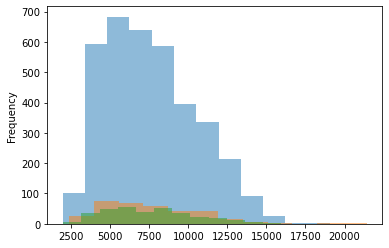

In [88]:
# df_list = [df_train_fd, df_valid_fd, df_test_fd, df_train_tms, df_valid_tms, df_test_tms]

print("SummScreen Forever Dreaming TRAIN -- INPUT length distribution (words) - blue")
ax = df_train_fd.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen Forever Dreaming VALIDATION -- INPUT length distribution (words) - yellow")
ax = df_valid_fd.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen Forever Dreaming TEST -- INPUT length distribution (words) - green")
ax = df_test_fd.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

SummScreen TV Megasite TRAIN -- INPUT length distribution (words)
SummScreen TV Megasite VALIDATION -- INPUT length distribution (words) - yellow
SummScreen TV Megasite TEST -- INPUT length distribution (words) - green


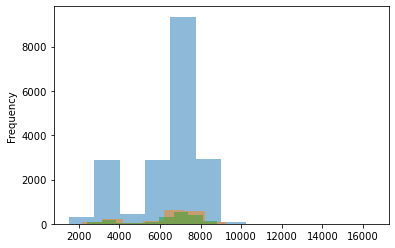

In [87]:
print("SummScreen TV Megasite TRAIN -- INPUT length distribution (words) - blue")
ax = df_train_tms.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen TV Megasite VALIDATION -- INPUT length distribution (words) - yellow")
ax = df_valid_tms.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen TV Megasite TEST -- INPUT length distribution (words) - green")
ax = df_test_tms.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

SummScreen Forever Dreaming TRAIN -- OUTPUT length distribution (words) - blue
SummScreen Forever Dreaming VALIDATION -- OUTPUT length distribution (words) - yellow


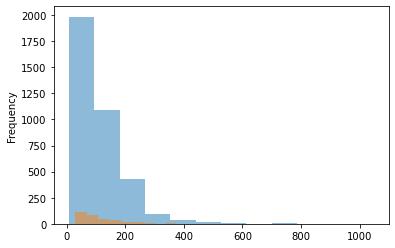

In [90]:
print("SummScreen Forever Dreaming TRAIN -- OUTPUT length distribution (words) - blue")
ax = df_train_fd.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen Forever Dreaming VALIDATION -- OUTPUT length distribution (words) - yellow")
ax = df_valid_fd.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

# print("SummScreen Forever Dreaming TEST -- OUTPUT length distribution (words) - green")
# ax = df_test_fd.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

SummScreen TV Megasite TRAIN -- OUTPUT length distribution (words)
SummScreen TV Megasite VALIDATION -- OUTPUT length distribution (words) - yellow
SummScreen TV Megasite TEST -- OUTPUT length distribution (words) - green


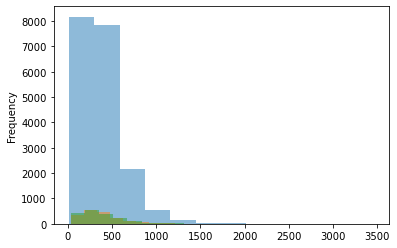

In [91]:
print("SummScreen TV Megasite TRAIN -- OUTPUT length distribution (words)")
ax = df_train_tms.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen TV Megasite VALIDATION -- OUTPUT length distribution (words) - yellow")
ax = df_valid_tms.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen TV Megasite TEST -- OUTPUT length distribution (words) - green")
ax = df_test_tms.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

In [69]:
lengths = [len(line) for line in tokenized_col]
print(sum(lengths)/len(lengths))

7597.096378981759


In [15]:
# SummScreen Forever Dreaming Example

print(df_train_fd.input[7])

ACT ONE Scene One - KACL Frasier has just finished his show. Roz comes in from her booth.
Frasier: Oh well, good show today, Roz. I particularly thought that- Roz notices a woman, Connie, talking to an employee in the hall.
Roz: Oh my God, there's that Connie from Promotions. Every time she sees me, she hits me up for another charity.
Frasier: You know, Roz, maybe it's time you set some limits. Good lord, how hard can it be to say "no" just once? Oh well, look who I'm talking to.
Roz bats his arm. He shrugs. Connie comes in.
Connie: Hi, Frasier. Roz, I was looking for you-
Roz: O.K. wait, Connie, before you say anything, there's something I need to get off my chest. I have bought Girl Scout cookies from you, I have paid for your kids' band uniforms, I've bought tickets to every raffle your church ever had, and I'm tapped out. So whatever it is you came to say to me, I'm not interested.
Connie: Well, I'll just go then. [turns to leave, then] Oh, by the way, my church had its raffle draw

In [17]:
df_train_fd.output[7]

'Roz wins a free trip to a ski lodge, including lessons from a skiing instructor, but is talked into trading them to Frasier in return for a big-screen TV. So Frasier decides to take the whole family to the ski lodge, including Daphne and her friend Annie (played by guest star Cynthia Lamontagne ), a swimsuit model. There they meet Guy (played by guest star James Patrick Stuart ), a gay ski instructor, who likes Niles and thinks Niles likes him back. This is confirmed by misinformation given by Martin who has hearing difficulty due to a blocked ear. Throughout the episode, confusion arises as Frasier pursues Annie, who desires Niles. Niles, however, longs to confess his feelings for Daphne, while Daphne attempts to pick up Guy, who thinks that Daphne and Annie are together.'

In [94]:
# Scene: 
# SCENE_BREAK
# []
# includes descriptions of the setting and actions of the heroes

df_train_fd.output[0]

'When residue left from demonic vanquishes builds up in the manor, the sisters lose sleep and it takes over their lives. They call upon the Witch Doctor, whom Leo does not trust. The Witch Doctor makes a house call to the Charmed Ones but because of the massive amount of demonic energy he believes they are evil. It turns out that Leo was right not to trust him, as he tries to kill the sisters by using voodoo dolls to make them obsess and lead them down various paths of destruction. Piper becomes obsessed with cleaning, Paige becomes obsessed with marrying her ex-boyfriend Glen, and Phoebe becomes obsessed with eliminating her work rivals.'

In [96]:
# SummScreen TV Megasite Example

print(df_train_tms.input[0])

[Knock on door]
J.R.: Hey.
Babe: Hey.
J.R.: Can I come in? Since I'm no longer a suspected criminal, I figured we could do a more personal Christmas a little later on.
Babe: Yeah. Yeah, come on in.
J.R.: All right.
Babe: So, what happened, J.R.? I mean, did you finally remember where you were the night Zach was hit?
J.R.: With a little help from my mom. It's a long story.
Babe: So --
J.R.: Well, a gentleman's not supposed to kiss and tell, but I guess it depends on who the lady is. I was with Amanda, I was drunk as a skunk, and I told her every rotten thing that I've ever done.
Babe: And she never said anything?
J.R.: Payback is sweet.
Babe: That bitch!
J.R.: I'm not going to argue with you on that one. But you want to know what the best part is? The cherry on top of the Christmas pie? Guess who else knew the truth and buried it like a bone in the backyard?
Babe: You're kidding.
J.R.: Nope. Thanks again, Dad, for everything.
[SCENE_BREAK]
Adam: Hello, Stuart, it's your brother. Um -- I

In [97]:
# []
# SCENE_BREAK
# is structured more like a dialogue

print(df_train_tms.output[0])

Adam calls Stuart and tries to set up a time for them to have coffee together. Hannah comes in with a folder in her hand and tells Adam that she had what he wanted, Zach's head on a platter. Jack visits Greenlee and inquires if she trusts him. J.R. visits Babe, bearing gifts. He lets her know what had happened and how Amanda had set him up, and that Adam had known about it all along. Kendall is brought into an interrogation room. Zach walks up to the door and asks her why is she throwing everything away. Jack comes into the room and tells Kendall that he would like to represent her. Aidan visits Greenlee. Greenlee tells him that she thinks everyone had done a 180. Aidan was friends with Kendall and Greenlee was friends with Zach. Greenlee can't understand why Kendall is doing this. Hannah fills Adam in on what she had done to Zach and how everything now belongs to Adam. In putting the presents under the tree, J.R. finds one to Richie from Babe. Richie's doc from the prison visits him. 

# Split train_data

In [74]:
with open("../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/train.json", "r") as file:
    train = json.load(file)

In [75]:
with open("../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/eval.json", "r") as file:
    val = json.load(file)

In [76]:
len(val)

338

In [78]:
train.extend(val)

In [79]:
len(train)

4008

In [80]:
with open("../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/train_plus_val.json", "w") as file:
    json.dump(train, file)

In [48]:
for i in range(0, len(train), 350):
    if i == 3500:
        train_curr = train[i:]
        print(len(train_curr))
    else:
        train_curr = train[i:(i+350)]
        print(len(train_curr))
    with open(f"../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/train_{i}.json", "w") as file:
        json.dump(train_curr, file)

350
350
350
350
350
350
350
350
350
350
173


In [54]:
list_of_paths = [
    "train_0.json",
    "train_350.json",
    "train_700.json",
    "train_1050.json",
    "train_1400.json",
    "train_1750.json",
    "train_2100_1.json",
    "train_2100_2.json",
    "train_2450.json",
    "train_2800.json",
    "train_3150.json",
    "train_3500.json",
]
main_path = "../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data"

all_jsons = []
for i in list_of_paths:
    with open(os.path.join(main_path, i), "r") as file:
        train = json.load(file)
    all_jsons.extend(train)
    
print(len(all_jsons))

3670


In [55]:
all_dialogues_with_keywords = []

for item in all_jsons:
    if item.get('key_phrases'):
        all_dialogues_with_keywords.append(item)
        
print(len(all_dialogues_with_keywords))

3670


In [62]:
with open("../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/train.json", "w") as file:
    json.dump(all_jsons, file)

In [59]:
with open(os.path.join(main_path, "train_2100_1.json"), "r") as file:
    train_2100_1 = json.load(file)

In [60]:
len(train_2100_1)

205

In [61]:
for item in train_2100_1:
    print(len(item.get('key_phrases')))

338
868
595
295
292
583
292
390
185
400
242
366
224
298
278
482
364
428
805
314
517
214
279
427
165
285
304
259
109
199
527
660
290
300
451
335
212
409
290
580
207
372
244
621
337
312
253
404
221
330
465
240
344
448
742
369
257
411
593
326
815
178
231
457
162
773
583
450
309
221
352
697
508
272
389
227
307
147
502
535
319
339
207
253
705
552
479
242
270
541
323
168
351
354
333
256
712
217
575
386
788
261
269
403
264
223
445
273
222
454
218
489
529
249
496
232
259
508
339
184
754
211
631
330
557
501
406
141
428
361
481
256
191
321
239
533
854
585
454
697
440
547
357
624
788
425
362
496
157
870
443
916
343
170
317
211
455
666
507
513
207
466
649
580
502
498
268
199
258
248
581
718
146
748
471
206
449
634
535
540
469
228
383
270
590
140
224
591
324
359
322
288
430
612
570
433
536
347
265
224
885
404
737
225
176


# Dataset statistics for most recent data

In [43]:
# train data
with open("../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/train_plus_val.json", "r") as file:
    train = json.load(file)

# valid data
with open("../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/test.json", "r") as file:
    valid = json.load(file)

# test data
with open("../architectures/ConvSumm/CODS/SUMMscreen/fd/clean_data/test_challenge.json", "r") as file:
    test = json.load(file)

In [47]:
df_train_fd = convert_to_df(train)
df_valid_fd = convert_to_df(valid)
df_test_fd = convert_to_df(test)

In [53]:
df_train_fd

,clean_dialog,dialogue,function_dialogs,id,key_phrases,label,module_index,summary
0,[[ manor . paige's room . paige is there lying...,[Scene: Manor. Paige's room. Paige is there ly...,[[ manor . paige's room . paige is there lying...,fd_Charmed_05x13,"[[manor, paige], [glen, was getting worried ab...","[1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, ...","[5, -1, -1, -1, -1, -1, -1, 5, -1, 0, -1, -1, ...",When residue left from demonic vanquishes buil...
1,"[[ int . scott redisence - bathroom - day ], (...",[INT. SCOTT REDISENCE - BATHROOM - DAY]\n(Ther...,"[[ int . scott redisence - bathroom - day ], (...",fd_One_Tree_Hill_02x14,"[[], [there's a green towel wrapped around luc...","[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, ...","[5, 5, -1, 5, 5, 5, 1, -1, -1, -1, -1, 5, -1, ...",As his marriage with Haley continues to get wo...
2,"[[ salvatore's house ], ( elena is waiting for...",[Salvatore's house]\n(Elena is waiting for Eli...,"[[ salvatore's house ], ( elena is waiting for...",fd_The_Vampire_Diaries_02x19,"[[salvatore's house], [elena, is waiting for e...","[1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, ...","[5, 5, -1, -1, 5, 5, -1, -1, 2, -1, 5, -1, -1,...","After Elena removed the dagger, Elijah wakes, ..."
3,[Clarke (V.O.): i was born in space . i've nev...,Clarke (V.O.): I was born in space. I've never...,[Clarke (V.O.): i was born in space . i've nev...,fd_The_100_01x08,"[[was sent here because we broke the law, the ...","[1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, ...","[-1, -1, -1, -1, -1, -1, -1, -1, 0, -1, -1, 5,...",Video connection is established with The Ark. ...
4,"[the romans, dennis spooner, 5, 1: int . villa...",THE ROMANS\nDENNIS SPOONER\n5:40pm - 6:05pm\n[...,"[5, 1: int . villa at assessium . outside the ...",fd_Doctor_Who_1963_02x13,"[[], [the doctor ' s room], [the doctor], [the...","[0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, ...","[-1, -1, 5, 5, 5, -1, 5, -1, 5, 4, 5, 1, 5, 1,...","Landing in Rome, A.D. 64 the travellers take a..."
5,"[Teleplay by: sherry bilsing & ellen plummer, ...",Teleplay by: Sherry Bilsing & Ellen Plummer\nS...,"[Story by: seth kurland, [ central perk , joey...",fd_FRIENDS_06x13,"[[], [joey, is giving rachel , chandler , phoe...","[0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[-1, 5, -1, -1, 5, -1, -1, 1, -1, -1, -1, 1, -...",Joey uses his position as waiter to give all t...
6,[( continuing from last week's episode . baden...,(Continuing from last week's episode. Badenwei...,[( continuing from last week's episode . baden...,fd_Alias_01x06,"[[continuing from last week's episode, sydney ...","[1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, ...","[5, 4, -1, 5, -1, 5, -1, 5, -1, 5, -1, 5, 0, -...",Sydney becomes convinced that her father was r...
7,[act one scene one - kacl frasier has just fin...,ACT ONE Scene One - KACL Frasier has just fini...,[act one scene one - kacl frasier has just fin...,fd_Frasier_05x14,"[[kacl frasier has just finished his show], [t...","[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, ...","[-1, -1, -1, 1, -1, -1, -1, 5, -1, 1, -1, -1, ...","Roz wins a free trip to a ski lodge, including..."
8,[Scene: the comic book store . raj enters carr...,Scene: The comic book store. Raj enters carryi...,[Scene: the comic book store . raj enters carr...,fd_The_Big_Bang_Theory_03x16,"[[comic book], [], [], ['s nothing more awesom...","[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, ...","[-1, 4, 1, -1, 1, -1, 0, -1, 1, -1, -1, -1, -1...",Sheldon tries to meet Stan Lee at a comic book...
9,"["" the bodies in the book "", teaser, ( open wi...","""The Bodies in the Book""\n[SCENE_BREAK]\nTEASE...","["" the bodies in the book "", teaser, ( open wi...",fd_Bones_02x15,"[[the bodies, in the book], [], [sully and bre...","[1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, ...","[-1, -1, 5, -1, -1, 5, -1, 5, -1, 5, -1, -1, -...",Three separate bodies are found murdered exact...


In [55]:
#df_list = [df_train_fd, df_valid_fd, df_test_fd]
df_list = [df_test_fd]

for count, df in enumerate(df_list):
    df["tokenized_input"] = tokenize_column(df.dialogue)
    df["tokenized_input_length"] = [len(line) for line in df.tokenized_input]


In [62]:
print("SummScreen Forever Dreaming TRAIN -- INPUT length distribution (words) - blue")
ax = df_train_fd.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen Forever Dreaming VALIDATION -- INPUT length distribution (words) - yellow")
ax = df_valid_fd.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen Forever Dreaming TEST -- INPUT length distribution (words) - green")
ax = df_test_fd.tokenized_input_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen Forever Dreaming TRAIN -- OUTPUT length distribution (words) - blue")
ax = df_train_fd.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

print("SummScreen Forever Dreaming VALIDATION -- OUTPUT length distribution (words) - yellow")
ax = df_valid_fd.tokenized_output_length.plot.hist(bins=12, alpha=0.5)

SummScreen Forever Dreaming TRAIN -- INPUT length distribution (words) - blue


ModuleNotFoundError: No module named 'matplotlib'

In [63]:
df_list = [df_train_fd, df_valid_fd, df_test_fd]

for df in df_list:
    input_lengths = df.tokenized_input_length
    print(input_lengths.describe())
    

count     4008.000000
mean      7587.906687
std       2917.680071
min       1934.000000
25%       5235.750000
50%       7263.500000
75%       9574.250000
max      21435.000000
Name: tokenized_input_length, dtype: float64
count      337.000000
mean      7618.145401
std       2834.763147
min       1983.000000
25%       5325.000000
50%       7314.000000
75%       9499.000000
max      15941.000000
Name: tokenized_input_length, dtype: float64
count      459.000000
mean      7254.860566
std       2219.243110
min       2291.000000
25%       5637.500000
50%       7045.000000
75%       8825.500000
max      19707.000000
Name: tokenized_input_length, dtype: float64


In [64]:
df_list = [df_train_fd, df_valid_fd]

for df in df_list:
    output_lengths = df.tokenized_output_length
    print(output_lengths.describe())

count    4008.000000
mean      111.375499
std        83.854334
min         8.000000
25%        55.000000
50%        88.000000
75%       146.000000
max       822.000000
Name: tokenized_output_length, dtype: float64
count    337.000000
mean     123.344214
std       93.855989
min       29.000000
25%       59.000000
50%       96.000000
75%      150.000000
max      583.000000
Name: tokenized_output_length, dtype: float64


In [66]:
len(train)

4008

In [70]:
train[0]['clean_dialog']

["[ manor . paige's room . paige is there lying on her bed , talking on the phone . ]",
 "Paige: hey , it's so good to talk to you . i was getting worried about you . you've been gone for far too long , glen .",
 "Glen: yeah , i'm sorry , i-i should've called and let you know that i was alright . i guess i , uh , ended up staying a little longer than i thought .",
 "Paige: that's okay , you'll just have to take me to dinner tomorrow night to make up to me .",
 "Glen: dinner . i-i can't tomorrow night , paige , i got plans .",
 'Paige: oh .',
 'Glen: i still wanna meet you though , i mean , i really wanna see you .',
 '( paige flips through a photo album with pictures of her and glen inside . )',
 "Paige: good , ' cause , um , there's actually something i really want to talk to you about .",
 "Glen: really ? sounds mysterious . that's actually great because there's something that i really wanna talk to you about too .",
 "Paige: great . then it's a date . ( the room creeks and paige ign

In [123]:
for count, line in enumerate(train[0]['clean_dialog']):
    if line == 'Piper: hm ?':
        print("start", count)
    if line == '( she puts the diapers on a shelf . )':
        print("end", count)
    

start 22
end 26


In [125]:
item = 0

for count, module_index, clean_dialog, key_phrases in zip(list(range(len(train[item]['module_index']))), train[item]['module_index'], train[item]['function_dialogs'], train[item]['key_phrases']):
    print(count, module_index, clean_dialog, key_phrases)

0 5 [ manor . paige's room . paige is there lying on her bed , talking on the phone . ] ['manor', 'paige']
1 -1 Paige: hey , it's so good to talk to you . i was getting worried about you . you've been gone for far too long , glen . ['glen', 'was getting worried about you']
2 -1 Glen: yeah , i'm sorry , i-i should've called and let you know that i was alright . i guess i , uh , ended up staying a little longer than i thought . ["should've called and let you know that i was alright"]
3 -1 Paige: that's okay , you'll just have to take me to dinner tomorrow night to make up to me . ["you'll just have to take me to dinner tomorrow night to make up to me"]
4 -1 Glen: dinner . i-i can't tomorrow night , paige , i got plans . ["can't tomorrow night , paige"]
5 -1 Paige: oh . []
6 -1 Glen: i still wanna meet you though , i mean , i really wanna see you . []
7 5 ( paige flips through a photo album with pictures of her and glen inside . ) ['paige', 'flips through a photo album with pictures of he

512 -1 Leo: phoebe . phoebe . piper ! ['piper']
513 5 ( phoebe's eyes glow and the hex is removed . she notices the butcher's knife . ) ["phoebe's eyes glow"]
514 -1 Phoebe: oh , dear . []
515 4 Leo: phoebe , is that you ? are you back ? ['phoebe']
516 1 Phoebe: yeah . what's going on ? []
517 -1 Phoebe: i don't understand . ( she hears the turkey gobble . ) oh , no . spencer ricks ? []
518 5 [ manor . paige's room . paige looks at a photo of her and glen . she then paces around the room . ] ['manor', 'paige', 'looks at a photo of her and glen']
519 5 [ park . glen is there in front of the lake . jessica walks up to him . ] ['glen']
520 -1 Jessica: hi . []
521 -1 Glen: hi . you said you wanted to talk ? []
522 -1 Jessica: no , i , got the message that you wanted to . []
523 5 ( paige arrives . ) ['paige']
524 -1 Paige: actually , i sent the message . i didn't think you guys would come if you knew i wanted to meet you . []
525 -1 Jessica: look , i'm outta here . []
526 -1 Paige: please 

In [104]:
len(train[1]['module_index'])
len(train[1]['function_dialogs'])

602

In [105]:
train[1]['function_dialogs']

['[ int . scott redisence - bathroom - day ]',
 "( there's a green towel wrapped around lucas ' waist and he's wearing a white t-shirt . he's standing in front of a steamed up mirror and looking down into the sink basin . )",
 'LUCAS: ( v . o ) octavio paz once wrote ; solitude is the profoundest fact of the human condition . ( he wipes the steam off the mirror with a hand . he studies himself . ) man is the only being who knows he is alone .',
 "( lucas continues to look at himself . his hair's grown . he turns to exit .",
 '[ int . scott residence - kitchen - day ]',
 '( shot of the table with breakfast on . dan is standing and reading the paper . lucas walks in , rubbing his eyes . )',
 "DAN: ( folds the paper and puts away . ) you know , if bogans keeps drilling threes , the cats will be tough to beat . how'd you sleep ?",
 'LUCAS: fine .',
 'DAN: great , grab a plate .',
 'LUCAS: ah , actually , uh . ( points back . ) i usually grab something on the way to school .',
 "DAN: come o

In [101]:
train[1].keys()

dict_keys(['id', 'summary', 'dialogue', 'clean_dialog', 'label', 'function_dialogs', 'module_index', 'key_phrases'])

In [95]:
train[1]['clean_dialog'][200:214]

['JULES: no one asked you to pay for my dress !',
 "DAN: you know , most women woulda just sent a thank you note , but if you're gonna yell at me , at least come inside .",
 '( he steps aside and jules stomps in while throwing glares at him . )',
 '( they walk into the living room and jules turns to him . )',
 'JULES: i want you to stay away from our wedding !',
 "DAN: speaking of your wedding , ( sighs ) what exactly were you planning to do about guests ? ( pause ) i mean , considering this whole thing is just an elaborate ruse designed to bring down my brother . ( pause ) i'm guessing that having your parents there might be a bit of a downer . ( pause ) i could lend you mine but . nah ( ! )",
 "JULES: i love your brother , dan . why won't you just leave us alone !",
 "DAN: ( with an evil look . ) because keith slept with deb . ( pause ) besides , i didn't pay you to fall in love with him .",
 "JULES: you know what ? ( throws the dress behind . ) screw ! i'll just tell him the truth .

In [97]:
train[1]['key_phrases'][200:214]

[[],
 [],
 ['dan'],
 ["'s no catch", "'m guessing even he'd have trouble dealing with this one"],
 [],
 ['forcing him to choose which way he wants to lose'],
 ["'s nothing she can do but see this through"],
 ['makes fun coz you get to watch them squirm',
  'you could tell keith about our arrangement , break his heart'],
 [],
 ['either way'],
 ['dan'],
 [],
 [],
 ["zoom in on dan's evil face"]]

In [77]:
print(len(train[0]['module_index']))
print(len(train[0]['key_phrases']))

564
564


In [76]:
train[0]['key_phrases'][22:27]

[[],
 [],
 [],
 ['are not sleeping'],
 ['takes them into the bedroom and places them on the shelf']]

In [73]:
train[0].keys()

dict_keys(['id', 'summary', 'dialogue', 'clean_dialog', 'label', 'function_dialogs', 'module_index', 'key_phrases'])